## 1. Setup — check GPU and imports

In [1]:
import torch
print("PyTorch:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

PyTorch: 2.11.0+cu128
CUDA available: True
GPU: Tesla T4


device(type='cuda')

In [2]:
# scikit-image gives us PSNR/SSIM metrics
import importlib, subprocess, sys
if importlib.util.find_spec("skimage") is None:
    subprocess.run([sys.executable, "-m", "pip", "install", "-q", "scikit-image"])
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
print("imports OK")

imports OK


In [3]:
import torch.nn as nn

class DnCNN(nn.Module):
    def __init__(self, depth=17, n_channels=64, image_channels=1, kernel_size=3):
        super().__init__()
        pad = kernel_size // 2
        layers = [nn.Conv2d(image_channels, n_channels, kernel_size, padding=pad, bias=True),
                  nn.ReLU(inplace=True)]
        for _ in range(depth - 2):
            layers += [nn.Conv2d(n_channels, n_channels, kernel_size, padding=pad, bias=False),
                       nn.BatchNorm2d(n_channels, eps=1e-4, momentum=0.95),
                       nn.ReLU(inplace=True)]
        layers += [nn.Conv2d(n_channels, image_channels, kernel_size, padding=pad, bias=False)]
        self.dncnn = nn.Sequential(*layers)

    def forward(self, x):
        # network predicts the residual (noise); clean = input - residual
        residual = self.dncnn(x)
        return x - residual

model = DnCNN().to(device)
n_params = sum(p.numel() for p in model.parameters())
print(f"Model built. Parameters: {n_params:,}")

Model built. Parameters: 556,096


In [4]:
import os, urllib.request

# Matched single-noise-level models: sigma -> checkpoint
WEIGHTS = {
    15: ("dncnn_15.pth", "https://github.com/cszn/KAIR/releases/download/v1.0/dncnn_15.pth"),
    25: ("dncnn_25.pth", "https://github.com/cszn/KAIR/releases/download/v1.0/dncnn_25.pth"),
    50: ("dncnn_50.pth", "https://github.com/cszn/KAIR/releases/download/v1.0/dncnn_50.pth"),
}

for sigma, (path, url) in WEIGHTS.items():
    if not os.path.exists(path):
        print(f"Downloading sigma={sigma}: {path} ...")
        urllib.request.urlretrieve(url, path)
        print("  done:", path)
    else:
        print(f"already present: {path}")

# Peek at one checkpoint's structure (sigma=25) to confirm the format
_state = torch.load(WEIGHTS[25][0], map_location=device)
if isinstance(_state, dict) and "state_dict" in _state:
    _state = _state["state_dict"]
print("\nSample checkpoint (sigma=25) tensors:", len(_state))
for k, v in list(_state.items())[:4]:
    print(" ", k, tuple(v.shape))

  done: dncnn_15.pth
  done: dncnn_25.pth
  done: dncnn_50.pth

Sample checkpoint (sigma=25) tensors: 34
  model.0.weight (64, 1, 3, 3)
  model.0.bias (64,)
  model.2.weight (64, 64, 3, 3)
  model.2.bias (64,)


In [5]:
import torch.nn as nn

# ---- Plain architecture: conv+ReLU only (matched dncnn_15/25/50 are BN-folded) ----
class DnCNNPlain(nn.Module):
    def __init__(s,depth=17,nc=64,img_ch=1,k=3):
        super().__init__(); p=k//2
        L=[nn.Conv2d(img_ch,nc,k,padding=p),nn.ReLU(inplace=True)]
        for _ in range(depth-2): L+=[nn.Conv2d(nc,nc,k,padding=p),nn.ReLU(inplace=True)]
        L+=[nn.Conv2d(nc,img_ch,k,padding=p)]
        s.dncnn=nn.Sequential(*L)
    def forward(s,x): return x - s.dncnn(x)

# ---- BN architecture: conv+BN+ReLU (the blind model keeps BatchNorm) ----
class DnCNNBN(nn.Module):
    def __init__(s,depth=17,nc=64,img_ch=1,k=3):
        super().__init__(); p=k//2
        L=[nn.Conv2d(img_ch,nc,k,padding=p,bias=True),nn.ReLU(inplace=True)]
        for _ in range(depth-2):
            L+=[nn.Conv2d(nc,nc,k,padding=p,bias=False),
                nn.BatchNorm2d(nc,eps=1e-4,momentum=0.95),nn.ReLU(inplace=True)]
        L+=[nn.Conv2d(nc,img_ch,k,padding=p,bias=False)]
        s.dncnn=nn.Sequential(*L)
    def forward(s,x): return x - s.dncnn(x)

def _get_state(path):
    s = torch.load(path, map_location=device, weights_only=False)
    if isinstance(s, dict) and "state_dict" in s: s = s["state_dict"]
    return s

def load_plain(path):
    """Load a BN-folded (conv-only) checkpoint by position."""
    state = _get_state(path)
    m = DnCNNPlain().to(device)
    ck = list(state.values()); pr = list(m.parameters())
    assert len(ck)==len(pr), f"{path}: count {len(ck)} vs {len(pr)}"
    with torch.no_grad():
        for p,w in zip(pr,ck):
            assert p.shape==w.shape, f"{path}: {tuple(p.shape)} vs {tuple(w.shape)}"
            p.copy_(w.to(device))
    m.eval(); return m

# ---- Matched models (keyed by sigma) ----
models = {}
for sigma,(path,_) in WEIGHTS.items():
    models[sigma] = load_plain(path)
    print(f"sigma={sigma}: loaded (plain)")

sigma=15: loaded (plain)
sigma=25: loaded (plain)
sigma=50: loaded (plain)


In [6]:
import os, urllib.request

BLIND_PATH = "dncnn_gray_blind.pth"
BLIND_URL  = "https://github.com/cszn/KAIR/releases/download/v1.0/dncnn_gray_blind.pth"
blind_model = None

if not os.path.exists(BLIND_PATH):
    try:
        print("Downloading blind model...")
        urllib.request.urlretrieve(BLIND_URL, BLIND_PATH)
    except Exception as e:
        print("Blind download failed:", e)

if os.path.exists(BLIND_PATH):
    state = _get_state(BLIND_PATH)

    # Auto-detect depth = number of 4-D conv weight tensors in the checkpoint
    n_conv = sum(1 for k,v in state.items() if k.endswith(".weight") and v.dim()==4)
    has_bn = any("running_mean" in k for k in state)
    print(f"Blind checkpoint: {len(state)} tensors | conv layers: {n_conv} | BatchNorm: {has_bn}")

    if has_bn:
        print("Unexpected: checkpoint has BatchNorm. Stopping so we don't load it wrong.")
        blind_model = None
    else:
        # Same plain architecture as the matched models, at the detected depth
        m = DnCNNPlain(depth=n_conv).to(device)
        ck = list(state.values()); pr = list(m.parameters())
        assert len(ck)==len(pr), f"count {len(ck)} vs {len(pr)} — depth detection off"
        with torch.no_grad():
            for p,w in zip(pr,ck):
                assert p.shape==w.shape, f"shape {tuple(p.shape)} vs {tuple(w.shape)}"
                p.copy_(w.to(device))
        m.eval()
        blind_model = m
        print(f"Blind model loaded (plain, depth={n_conv}) — all {len(ck)} tensors matched.")

Blind checkpoint: 40 tensors | conv layers: 20 | BatchNorm: False
Blind model loaded (plain, depth=20) — all 40 tensors matched.


In [7]:
from skimage import data, color, img_as_float

# Standard test images bundled with scikit-image (no download needed)
imgs = {
    "camera": img_as_float(data.camera()),                 # already grayscale
    "astronaut": color.rgb2gray(img_as_float(data.astronaut())),
    "coffee": color.rgb2gray(img_as_float(data.coffee())),
}
for name, im in imgs.items():
    print(name, im.shape, f"range [{im.min():.2f}, {im.max():.2f}]")

camera (512, 512) range [0.00, 1.00]
astronaut (512, 512) range [0.00, 1.00]
coffee (400, 600) range [0.00, 1.00]


In [8]:
def denoise(clean, sigma, seed=0, model=None):
    """Add Gaussian noise (sigma on 0-255 scale) and denoise with the MATCHED model.
    Pass `model=` explicitly to override (e.g. to test a mismatched model)."""
    rng = np.random.default_rng(seed)
    noisy = clean + rng.normal(0, sigma / 255.0, clean.shape)

    net = model if model is not None else models[sigma]   # matched by default
    t = torch.from_numpy(noisy).float().unsqueeze(0).unsqueeze(0).to(device)  # [1,1,H,W]
    with torch.no_grad():
        out = net(t)
    denoised = out.squeeze().cpu().numpy()

    return np.clip(noisy, 0, 1), np.clip(denoised, 0, 1)

def metrics(clean, test):
    return psnr(clean, test, data_range=1.0), ssim(clean, test, data_range=1.0)

In [9]:
SIGMAS = [15, 25, 50]
results = []

for name, clean in imgs.items():
    for sigma in SIGMAS:
        noisy, denoised = denoise(clean, sigma)
        p_noisy, s_noisy = metrics(clean, noisy)
        p_den, s_den = metrics(clean, denoised)
        results.append({
            "image": name, "sigma": sigma,
            "psnr_noisy": p_noisy, "psnr_denoised": p_den, "psnr_gain": p_den - p_noisy,
            "ssim_noisy": s_noisy, "ssim_denoised": s_den,
        })

import pandas as pd
df = pd.DataFrame(results)
pd.set_option("display.float_format", lambda x: f"{x:.3f}")
df

,image,sigma,psnr_noisy,psnr_denoised,psnr_gain,ssim_noisy,ssim_denoised
0,camera,15,24.792,32.486,7.693,0.463,0.894
1,camera,25,20.587,30.332,9.745,0.301,0.832
2,camera,50,15.188,28.090,12.902,0.148,0.746
3,astronaut,15,25.051,34.613,9.562,0.512,0.923
4,astronaut,25,20.750,31.817,11.066,0.360,0.851
5,astronaut,50,15.200,28.115,12.915,0.198,0.774
6,coffee,15,24.819,32.909,8.090,0.510,0.905
7,coffee,25,20.539,30.602,10.063,0.335,0.852
8,coffee,50,14.954,27.526,12.572,0.160,0.752


In [10]:
# Average PSNR/SSIM by noise level
summary = df.groupby("sigma")[["psnr_noisy", "psnr_denoised", "psnr_gain",
                                "ssim_noisy", "ssim_denoised"]].mean()
summary

,psnr_noisy,psnr_denoised,psnr_gain,ssim_noisy,ssim_denoised
sigma,,,,,
15,24.887,33.336,8.448,0.495,0.907
25,20.626,30.917,10.291,0.332,0.845
50,15.114,27.910,12.796,0.169,0.757


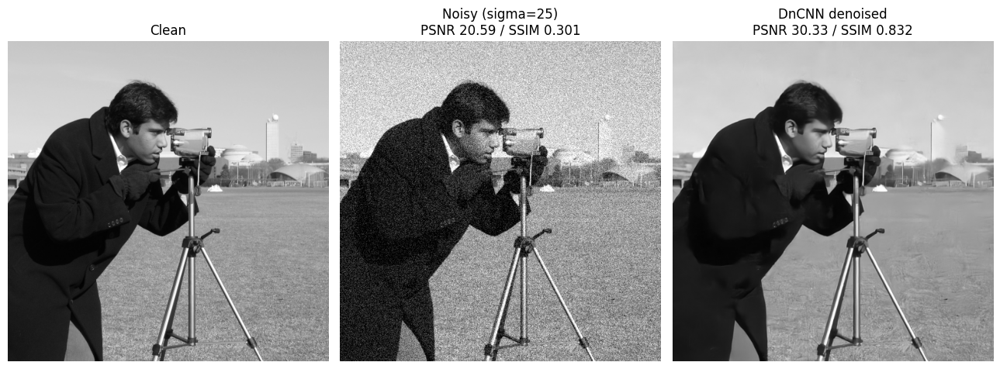

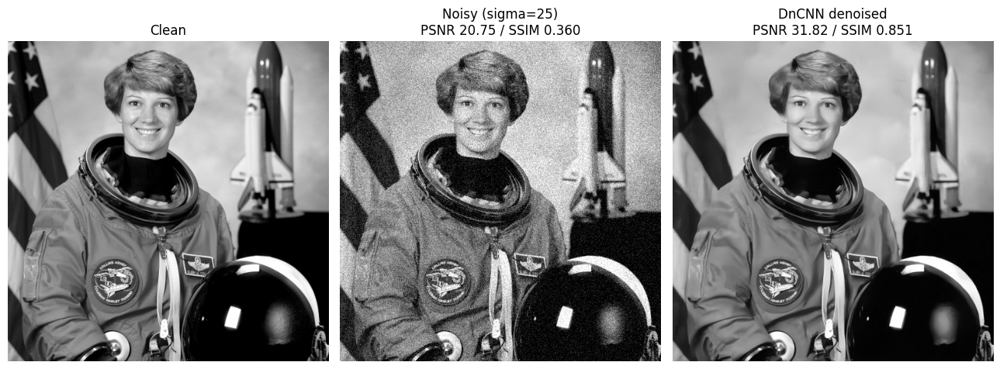

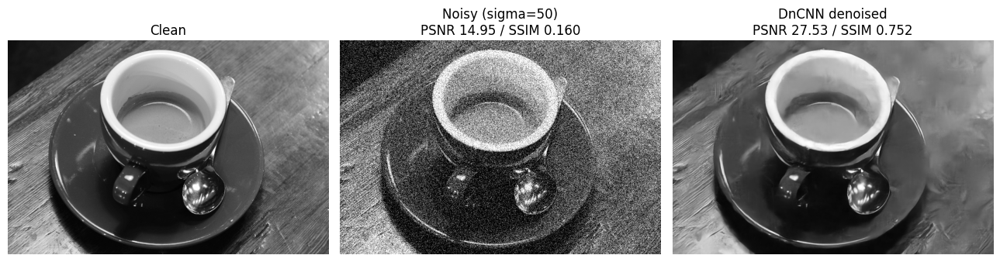

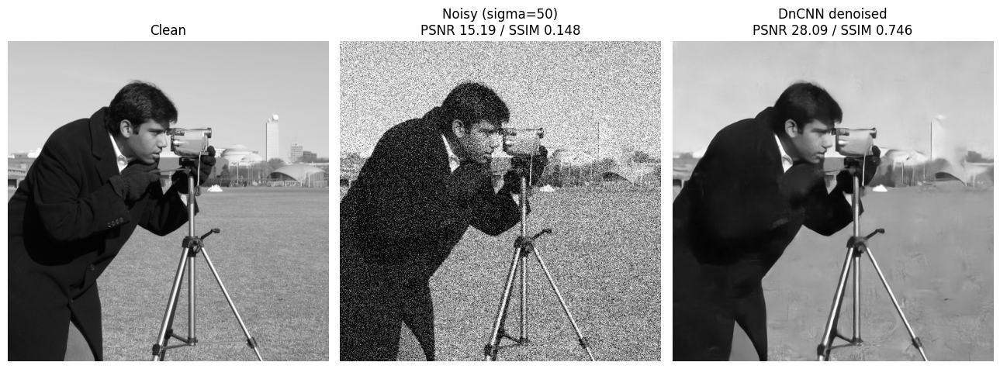

In [11]:
def show(name, sigma, seed=0):
    clean = imgs[name]
    noisy, denoised = denoise(clean, sigma, seed)
    p_n, s_n = metrics(clean, noisy)
    p_d, s_d = metrics(clean, denoised)

    fig, ax = plt.subplots(1, 3, figsize=(13, 5))
    ax[0].imshow(clean, cmap="gray", vmin=0, vmax=1); ax[0].set_title("Clean")
    ax[1].imshow(noisy, cmap="gray", vmin=0, vmax=1)
    ax[1].set_title(f"Noisy (sigma={sigma})\nPSNR {p_n:.2f} / SSIM {s_n:.3f}")
    ax[2].imshow(denoised, cmap="gray", vmin=0, vmax=1)
    ax[2].set_title(f"DnCNN denoised\nPSNR {p_d:.2f} / SSIM {s_d:.3f}")
    for a in ax: a.axis("off")
    plt.tight_layout(); plt.show()

show("camera", 25)
show("astronaut", 25)
show("coffee", 50)
show("camera", 50)   # now denoised by the matched sigma=50 model

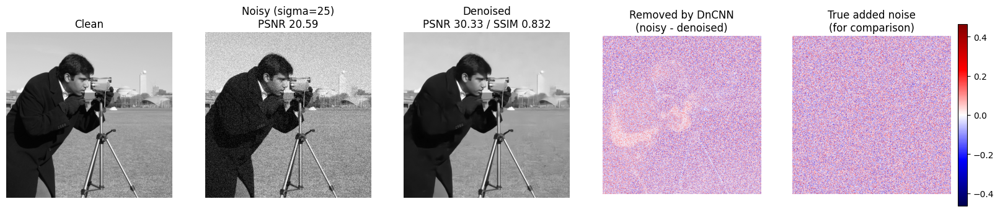

camera, sigma=25: RMSE(removed vs true noise) = 9.13 (0-255 scale) -> lower means the model isolated the noise cleanly


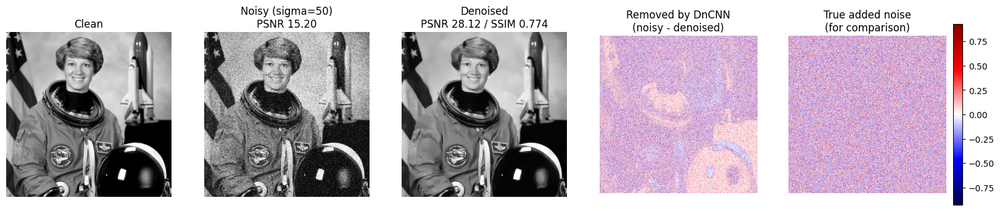

astronaut, sigma=50: RMSE(removed vs true noise) = 20.01 (0-255 scale) -> lower means the model isolated the noise cleanly


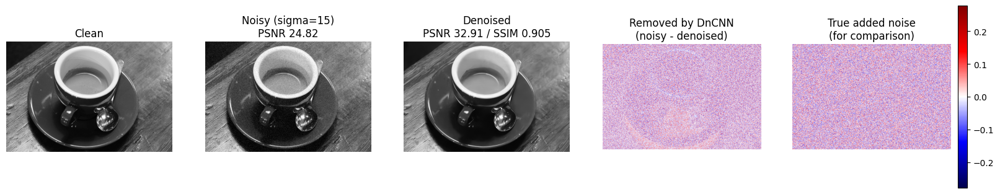

coffee, sigma=15: RMSE(removed vs true noise) = 6.13 (0-255 scale) -> lower means the model isolated the noise cleanly


In [12]:
def show_residual(name, sigma, seed=0):
    clean = imgs[name]
    rng = np.random.default_rng(seed)
    true_noise = rng.normal(0, sigma / 255.0, clean.shape)   # same seed as denoise()
    noisy, denoised = denoise(clean, sigma, seed)
    removed = noisy - denoised                                # what DnCNN took out

    p_n, s_n = metrics(clean, noisy)
    p_d, s_d = metrics(clean, denoised)

    # symmetric scale for the two noise-like panels
    lim = max(abs(removed).max(), abs(true_noise).max())

    fig, ax = plt.subplots(1, 5, figsize=(20, 4.5))
    ax[0].imshow(clean, cmap="gray", vmin=0, vmax=1); ax[0].set_title("Clean")
    ax[1].imshow(noisy, cmap="gray", vmin=0, vmax=1)
    ax[1].set_title(f"Noisy (sigma={sigma})\nPSNR {p_n:.2f}")
    ax[2].imshow(denoised, cmap="gray", vmin=0, vmax=1)
    ax[2].set_title(f"Denoised\nPSNR {p_d:.2f} / SSIM {s_d:.3f}")
    ax[3].imshow(removed, cmap="seismic", vmin=-lim, vmax=lim)
    ax[3].set_title("Removed by DnCNN\n(noisy - denoised)")
    im = ax[4].imshow(true_noise, cmap="seismic", vmin=-lim, vmax=lim)
    ax[4].set_title("True added noise\n(for comparison)")
    for a in ax: a.axis("off")
    fig.colorbar(im, ax=ax[3:5], fraction=0.025, pad=0.02)
    plt.show()

    # how close is the removed noise to the actual noise?
    res_err = np.sqrt(np.mean((removed - true_noise) ** 2)) * 255
    print(f"{name}, sigma={sigma}: RMSE(removed vs true noise) = {res_err:.2f} (0-255 scale) "
          f"-> lower means the model isolated the noise cleanly")

# Matched models. Try a smooth-content and a textured image at each level.
show_residual("camera", 25)
show_residual("astronaut", 50)
show_residual("coffee", 15)

In [13]:
df.to_csv("dncnn_baseline_results.csv", index=False)
print("Saved dncnn_baseline_results.csv")
df

Saved dncnn_baseline_results.csv


,image,sigma,psnr_noisy,psnr_denoised,psnr_gain,ssim_noisy,ssim_denoised
0,camera,15,24.792,32.486,7.693,0.463,0.894
1,camera,25,20.587,30.332,9.745,0.301,0.832
2,camera,50,15.188,28.090,12.902,0.148,0.746
3,astronaut,15,25.051,34.613,9.562,0.512,0.923
4,astronaut,25,20.750,31.817,11.066,0.360,0.851
5,astronaut,50,15.200,28.115,12.915,0.198,0.774
6,coffee,15,24.819,32.909,8.090,0.510,0.905
7,coffee,25,20.539,30.602,10.063,0.335,0.852
8,coffee,50,14.954,27.526,12.572,0.160,0.752


In [14]:
# Download Set12 from the official cszn/DnCNN repo (raw PNGs)
import os, urllib.request
from skimage import io, img_as_float

SET12_DIR = "Set12"
os.makedirs(SET12_DIR, exist_ok=True)
base = "https://raw.githubusercontent.com/cszn/DnCNN/master/testsets/Set12"
for n in range(1, 13):
    fn = f"{n:02d}.png"
    dst = os.path.join(SET12_DIR, fn)
    if not os.path.exists(dst):
        urllib.request.urlretrieve(f"{base}/{fn}", dst)
files = sorted(os.path.join(SET12_DIR, f) for f in os.listdir(SET12_DIR) if f.endswith(".png"))
set12 = []
for f in files:
    im = img_as_float(io.imread(f))
    if im.ndim == 3:          # safety: collapse to gray if needed
        im = im.mean(axis=2)
    set12.append(im)
print(f"Set12 loaded: {len(set12)} images, sizes {[im.shape for im in set12[:3]]}...")

Set12 loaded: 12 images, sizes [(256, 256), (256, 256), (256, 256)]...


In [15]:
# Evaluate matched and blind models over Set12, averaged per noise level.
# Uses the same fixed-seed noise so matched vs blind is a fair comparison.
import pandas as pd

def eval_model_on_set(images, sigma, net, seed=0):
    ps, ss = [], []
    for k, clean in enumerate(images):
        rng = np.random.default_rng(seed + k)          # distinct but reproducible per image
        noisy = clean + rng.normal(0, sigma/255.0, clean.shape)
        t = torch.from_numpy(noisy).float().unsqueeze(0).unsqueeze(0).to(device)
        with torch.no_grad():
            den = net(t).squeeze().cpu().numpy()
        den = np.clip(den, 0, 1)
        p, s = metrics(clean, den)
        ps.append(p); ss.append(s)
    return float(np.mean(ps)), float(np.mean(ss))

rows = []
for sigma in [15, 25, 50]:
    p_m, s_m = eval_model_on_set(set12, sigma, models[sigma])
    row = {"sigma": sigma, "matched_PSNR": p_m, "matched_SSIM": s_m}
    if blind_model is not None:
        p_b, s_b = eval_model_on_set(set12, sigma, blind_model)
        row.update({"blind_PSNR": p_b, "blind_SSIM": s_b})
    rows.append(row)

set12_df = pd.DataFrame(rows)
pd.set_option("display.float_format", lambda x: f"{x:.3f}")
print("Average over Set12 (12 images):")
set12_df

Average over Set12 (12 images):


,sigma,matched_PSNR,matched_SSIM,blind_PSNR,blind_SSIM
0,15,32.874,0.906,32.701,0.903
1,25,30.458,0.864,30.382,0.863
2,50,27.202,0.782,27.224,0.782


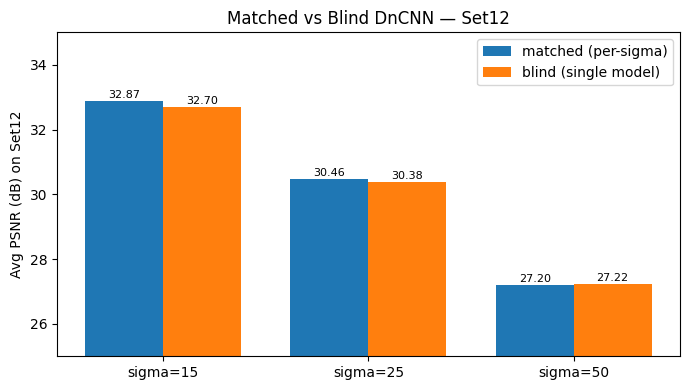

Saved dncnn_set12_results.csv


In [16]:
# Side-by-side bar chart: matched vs blind PSNR per noise level
fig, ax = plt.subplots(figsize=(7,4))
x = np.arange(len(set12_df)); w = 0.38
ax.bar(x - w/2, set12_df["matched_PSNR"], w, label="matched (per-sigma)")
if "blind_PSNR" in set12_df:
    ax.bar(x + w/2, set12_df["blind_PSNR"], w, label="blind (single model)")
ax.set_xticks(x); ax.set_xticklabels([f"sigma={s}" for s in set12_df["sigma"]])
ax.set_ylabel("Avg PSNR (dB) on Set12"); ax.set_ylim(25, 35)
ax.set_title("Matched vs Blind DnCNN — Set12"); ax.legend()
for i,v in enumerate(set12_df["matched_PSNR"]): ax.text(i-w/2, v+0.1, f"{v:.2f}", ha="center", fontsize=8)
if "blind_PSNR" in set12_df:
    for i,v in enumerate(set12_df["blind_PSNR"]): ax.text(i+w/2, v+0.1, f"{v:.2f}", ha="center", fontsize=8)
plt.tight_layout(); plt.show()

set12_df.to_csv("dncnn_set12_results.csv", index=False)
print("Saved dncnn_set12_results.csv")

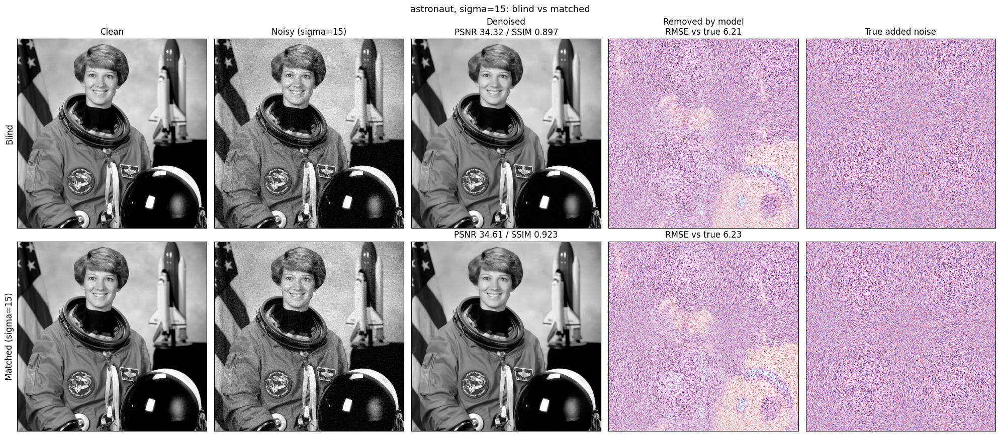

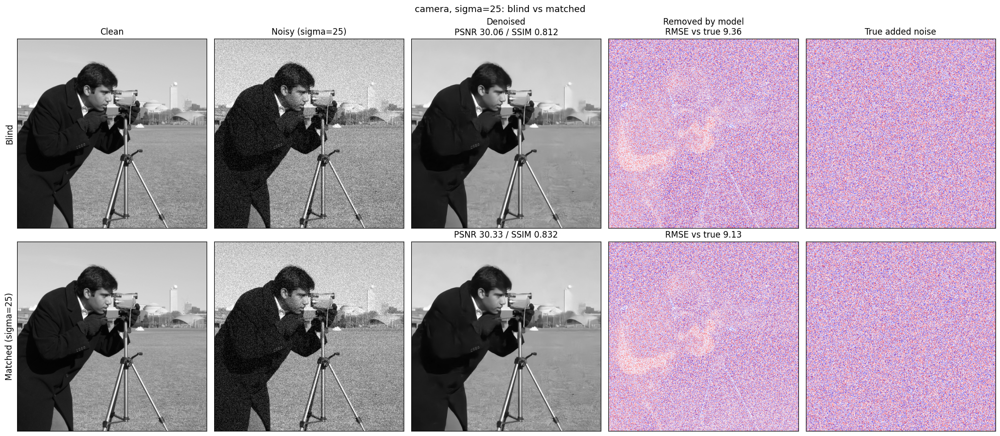

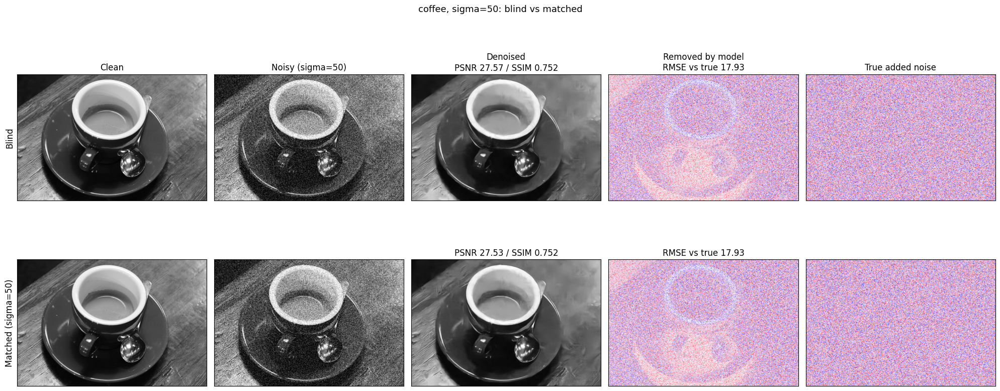

In [17]:
def show_blind_vs_matched(name, sigma, seed=0):
    if blind_model is None:
        print("Blind model not loaded — re-run the loader cell."); return
    clean = imgs[name]
    rng = np.random.default_rng(seed)
    true_noise = rng.normal(0, sigma/255.0, clean.shape)   # same seed convention as denoise()

    rows = [("Blind", blind_model), ("Matched (sigma=%d)" % sigma, models[sigma])]
    fig, axes = plt.subplots(2, 5, figsize=(20, 9))

    for r,(tag,net) in enumerate(rows):
        noisy, denoised = denoise(clean, sigma, seed, model=net)
        removed = noisy - denoised
        p_d, s_d = metrics(clean, denoised)
        res_rmse = np.sqrt(np.mean((removed - true_noise)**2)) * 255
        lim = max(abs(removed).max(), abs(true_noise).max())
        ax = axes[r]
        ax[0].imshow(clean, cmap="gray", vmin=0, vmax=1);  ax[0].set_ylabel(tag, fontsize=12)
        ax[0].set_title("Clean" if r==0 else "")
        ax[1].imshow(noisy, cmap="gray", vmin=0, vmax=1);  ax[1].set_title("Noisy (sigma=%d)"%sigma if r==0 else "")
        ax[2].imshow(denoised, cmap="gray", vmin=0, vmax=1)
        ax[2].set_title(("Denoised\n" if r==0 else "") + f"PSNR {p_d:.2f} / SSIM {s_d:.3f}")
        ax[3].imshow(removed, cmap="seismic", vmin=-lim, vmax=lim)
        ax[3].set_title(("Removed by model\n" if r==0 else "") + f"RMSE vs true {res_rmse:.2f}")
        ax[4].imshow(true_noise, cmap="seismic", vmin=-lim, vmax=lim)
        ax[4].set_title("True added noise" if r==0 else "")
        for a in ax:
            a.set_xticks([]); a.set_yticks([])
    plt.suptitle(f"{name}, sigma={sigma}: blind vs matched", fontsize=13)
    plt.tight_layout(); plt.show()

# A light, medium, and heavy noise example
show_blind_vs_matched("astronaut", 15)
show_blind_vs_matched("camera", 25)
show_blind_vs_matched("coffee", 50)